In [1]:
#%reset -f

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import proplot as pplt
import xarray as xr
import hvplot.xarray
import os
import pytropd.functions as tropdf
import cartopy.crs as ccrs
import geoviews as gv
import scipy.stats

from matplotlib import ticker as mticker

In [4]:
exp_name = 'W2h85SW90_f080' 
#exp_name = 'EMIL_vareps_10'
#exp_name = 'EMIL_HS_l6_w00'

work_path = '/work/bd1022/b381739'
home_path = '/home/b/b381739/'
inpath = f'{work_path}/{exp_name}/postprocessed'
outpath = f'{home_path}/plots' 

plot_format = 'png'

def read_complex(*args, **kwargs):
    ds = xr.open_dataset(*args, **kwargs)
    return ds['real'] + ds['imag'] * 1j

os.chdir(inpath)
#model_files = [fi for fi in os.listdir(inpath) if fi.endswith('pp.nc')]

ds_zm = xr.open_dataset(f'{exp_name}_zm_pp.nc').sortby('time')
ds_tp = xr.open_dataset(f'{exp_name}_transports_pp.nc').sortby('time')

ds_pls = xr.open_dataset(f'{exp_name}_pl_sel.nc').sortby('time')
ds_eke = read_complex(f'{exp_name}_eke_fft.nc').sortby('time')
ds_eofs = xr.open_dataset(f'{exp_name}_eofs.nc')
ds_pcs = xr.open_dataset(f'{exp_name}_pcs.nc')

os.chdir(outpath)
ds_pls

<xarray.Dataset>
Dimensions:   (lat: 32, lon: 128, plev: 5, time: 365)
Coordinates:
  * time      (time) datetime64[ns] 1999-01-01 1999-01-02 ... 1999-12-31
  * lon       (lon) float32 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
  * plev      (plev) float32 204.4 300.0 485.8 713.7 857.2
  * lat       (lat) float32 87.86 85.1 82.31 79.53 ... 9.767 6.977 4.186 1.395
Data variables:
    um1       (time, plev, lat, lon) float32 ...
    vm1       (time, plev, lat, lon) float32 ...
    vervel    (time, plev, lat, lon) float32 ...
    tm1       (time, plev, lat, lon) float32 ...
    aps       (time, lat, lon) float32 ...
    geopot_p  (time, plev, lat, lon) float32 ...
Attributes: (12/35)
    MESSy:                    MESSy version d2.55.2-1031-g2841c6f7d-dirty_284...
    MESSy_switch:             version 1.0
    MESSy_channel:            version 2.4.4
    MESSy_tracer:             version 2.6
    MESSy_timer:              version 0.1
    MESSy_qtimer:             version 3.0
    ...                       ...
    operating_host:           l20554
    operating_user:           Pablo Conrat Fuentes (b381739)
    channel_io_pe:            0
    channel_name:             vaxtra
    channel_file_type:        output
    channel_netcdf_lib:       4.8.1 of Feb 16 2022 21:18:58 $

In [5]:
ds_eke

<xarray.DataArray (time: 365, plev: 26, lat: 64, k: 19)>
array([[[[ 3.12792222e+01+0.00000000e+00j,
           7.37018586e+00-9.51973941e+00j,
           2.03648875e+00-5.04705550e+00j, ...,
          -6.39158768e-10+7.34922367e-08j,
          -2.73367708e-08+1.62838062e-07j,
           8.29049916e-08+7.28760241e-08j],
         [ 3.37349547e+01+0.00000000e+00j,
           1.32406000e+01-5.00813727e+00j,
           1.16108455e+01-1.22981267e+01j, ...,
           1.56048459e-06+2.48076757e-06j,
           4.04409306e-07+3.44219371e-07j,
           1.42508082e-07-1.76224015e-08j],
         [ 5.24845396e+01+0.00000000e+00j,
           1.93542614e+01+2.06557787e-01j,
           8.66707530e+00-6.43663477e+00j, ...,
           9.39385260e-04+1.26274104e-03j,
           3.49211112e-04+2.43606901e-04j,
           4.55288139e-05+8.39244196e-06j],
         ...,
         [ 3.82331304e+02+0.00000000e+00j,
...
                      nan           +nanj],
         ...,
         [            nan+0.00000000e+00j,
                      nan           +nanj,
                      nan           +nanj, ...,
                      nan           +nanj,
                      nan           +nanj,
                      nan           +nanj],
         [            nan+0.00000000e+00j,
                      nan           +nanj,
                      nan           +nanj, ...,
                      nan           +nanj,
                      nan           +nanj,
                      nan           +nanj],
         [            nan+0.00000000e+00j,
                      nan           +nanj,
                      nan           +nanj, ...,
                      nan           +nanj,
                      nan           +nanj,
                      nan           +nanj]]]])
Coordinates:
  * time     (time) datetime64[ns] 1999-01-01 1999-01-02 ... 1999-12-31
  * plev     (plev) float32 106.1 116.2 127.4 139.9 ... 857.2 921.1 967.4 995.7
  * lat      (lat) float32 87.86 85.1 82.31 79.53 ... -79.53 -82.31 -85.1 -87.86
  * k        (k) float64 0.0 1.0 2.0 3.0 4.0 5.0 ... 14.0 15.0 16.0 17.0 18.0

### Calculation of vertical weights

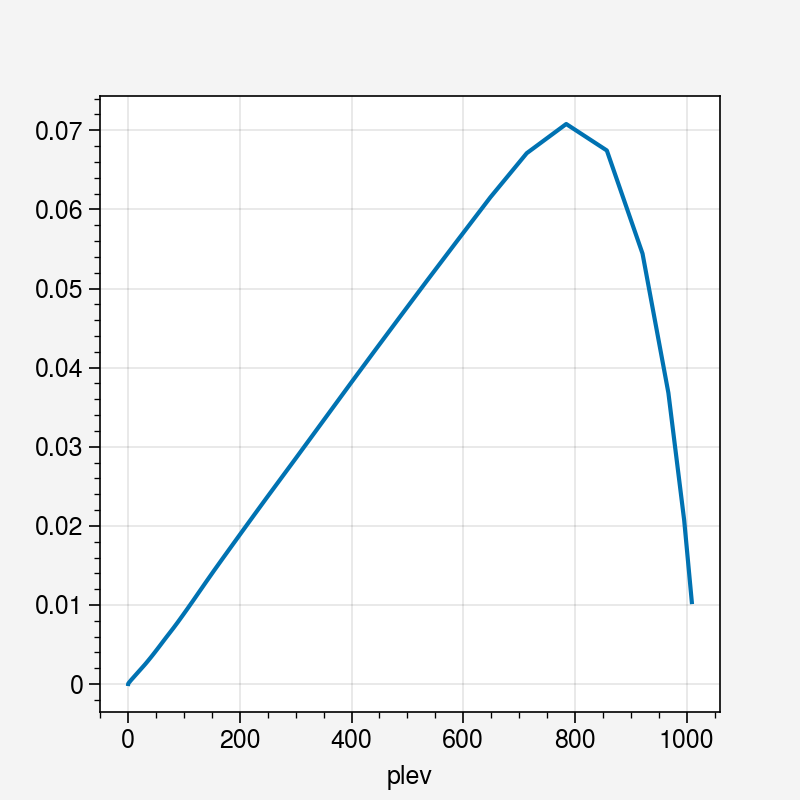

In [6]:
vert_weights = np.zeros(ds_zm.plev.size)

plevs = ds_zm.plev.values

vert_weights[0] = (plevs[1] + plevs[0])/2 - plevs[0]
vert_weights[1:-1] = (plevs[2:] + plevs[1:-1])/2 - (plevs[1:-1] + plevs[:-2])/2
vert_weights[-1] = 1.013e3 - (plevs[-1] + plevs[-2])/2
vert_weights = vert_weights/np.sum(vert_weights)

vert_weights = xr.DataArray(vert_weights, dims=['plev'], coords=dict(plev=(['plev'], ds_zm.plev.data)))

vert_weights.plot()

hor_weights = np.cos(np.radians(ds_zm.lat))/np.sum(np.cos(np.radians(ds_zm.lat)))


### Streamfunction calculation via TropD package

function: 

$ \frac{2\pi a cos \phi}{g} \int_{0}^{p} v dp $

In [7]:
ds = ds_zm.mean('time')
psi = tropdf.TropD_Calculate_StreamFunction(ds.vm1.values.T, 
                                            ds.lat.values,
                                            ds.plev.values)
ds_zm['psi'] = (['plev', 'lat'], psi.T)

## Fourier Analysis of Eddy Field

In [8]:
fv = ds_pls.vm1.sel(lat=45, time='2002-01-01', plev=500, method='nearest')
dx = ds_pls.lon.values[1] - ds_pls.lon.values[0]
k = np.fft.rfftfreq(fv.shape[0], d=dx/(360))


/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)
/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)
/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)


In [9]:
ds_zm

<xarray.Dataset>
Dimensions:   (lat: 64, plev: 90, time: 365)
Coordinates:
  * time      (time) datetime64[ns] 1999-01-01 1999-01-02 ... 1999-12-31
  * plev      (plev) float32 0.009946 0.03183 0.05808 ... 967.4 995.7 1.009e+03
  * lat       (lat) float32 87.86 85.1 82.31 79.53 ... -82.31 -85.1 -87.86
Data variables:
    um1       (time, plev, lat) float32 -0.1028 -0.1495 -0.1144 ... nan nan nan
    vm1       (time, plev, lat) float32 0.05043 0.04841 0.0109 ... nan nan nan
    vervel    (time, plev, lat) float32 3.029e-07 -4.588e-08 ... nan nan
    tm1       (time, plev, lat) float32 201.9 202.1 202.1 202.0 ... nan nan nan
    aps       (time, lat) float32 9.977e+04 9.965e+04 ... 9.937e+04 9.943e+04
    geopot_p  (time, plev, lat) float32 6.785e+05 6.785e+05 ... nan nan
    eke       (time, plev, lat) float32 3.518 3.73 3.688 3.434 ... nan nan nan
    psi       (plev, lat) float64 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan

In [10]:
pl = ds_pls.plev[3]
ds_va = ds_pls.vm1.sel(lat=45, plev=pl, method='nearest') - ds_pls.vm1.sel(lat=45, plev=pl, method='nearest').mean(['lon'])
ds_ua = ds_pls.um1.sel(lat=45, plev=pl, method='nearest') - ds_pls.um1.sel(lat=45, plev=pl, method='nearest').mean(['lon'])
ds_ta = ds_pls.tm1.sel(lat=45, plev=pl, method='nearest') - ds_pls.tm1.sel(lat=45, plev=pl, method='nearest').mean(['lon'])


/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)
/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)
/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)
/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexin

In [11]:
#fig, ax = pplt.subplots(nrows=1, ncols=3, share=False)

def fft_analysis(data):
    
    init_data = np.fft.fft(data[0,:])
    k = np.fft.fftfreq(init_data.shape[0], d=dx/(360))
    data_fft = np.zeros([data.shape[0], k.shape[0]], dtype='complex128')
    for it in range(data.shape[0]):
        data_fft[it] = np.fft.fft(data[it,:], norm='ortho') 
    
    return data_fft

def xr_spatial_fft_analysis(data):
    
    dx = data.lon.values[1] - data.lon.values[0]
    dim='k'
    result =  xr.apply_ufunc(
        np.fft.fft, data, input_core_dims=[['lon']], output_core_dims=[[dim]],
        kwargs={'norm':'ortho'}
    )
    k = np.fft.fftfreq(result.k.shape[0], d=dx/(360))
    result[dim] = k
    return result

def xr_temporal_fft_analysis(data, dt):
    
    dim='k'
    result =  xr.apply_ufunc(
        np.fft.fft, data, input_core_dims=[['time']], output_core_dims=[[dim]],
        kwargs={'norm':'ortho'}
    )
    k = np.fft.fftfreq(result.k.shape[0], d=dt)
    result[dim] = k
    return result



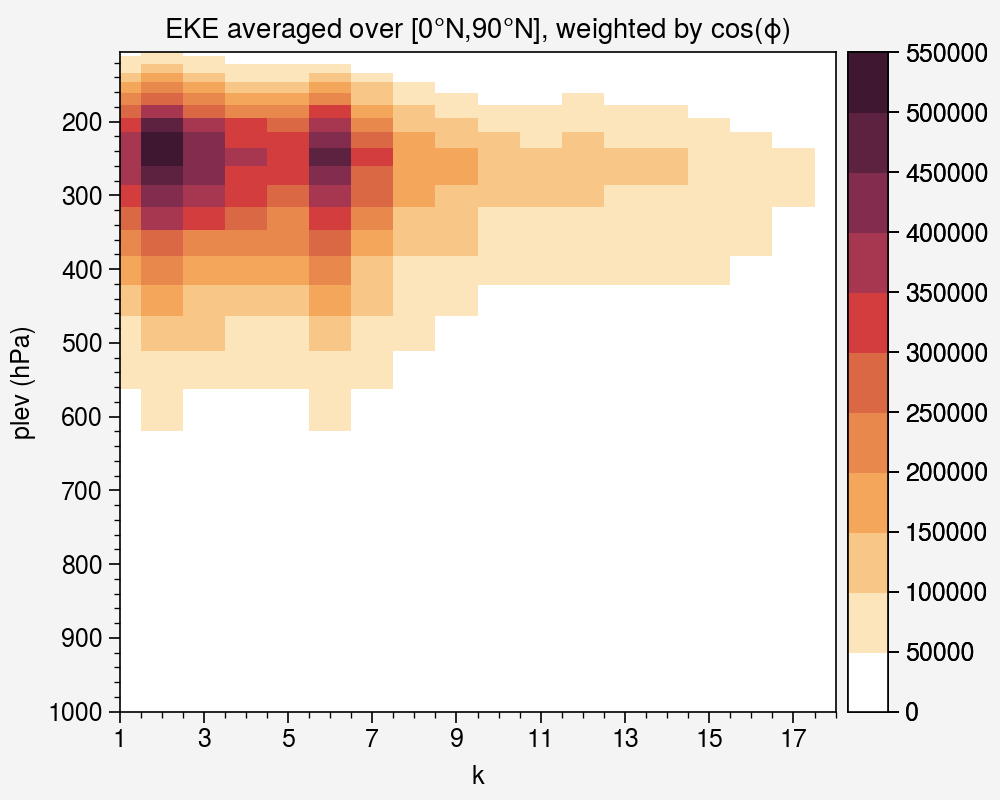

In [12]:
kmin, kmax = [1,18]
fig, ax = pplt.subplots(figsize=(5,4))
ax.pcolormesh((np.abs(ds_eke.sel(k=slice(kmin,kmax), lat=slice(90,0)))**2).weighted(hor_weights).mean('lat').mean('time'), colorbar='r')
ax.set_xlim([kmin,kmax])
ax.set_ylim([1000, ds_eke.plev[0]])
ax.set_xticks(np.arange(kmin,kmax+0.1,2))
ax.set_title(r'EKE averaged over [0°N,90°N], weighted by cos($\phi$)')
plt.show()
fig.savefig(f'{exp_name}_eke_hem_avg.{plot_format}')

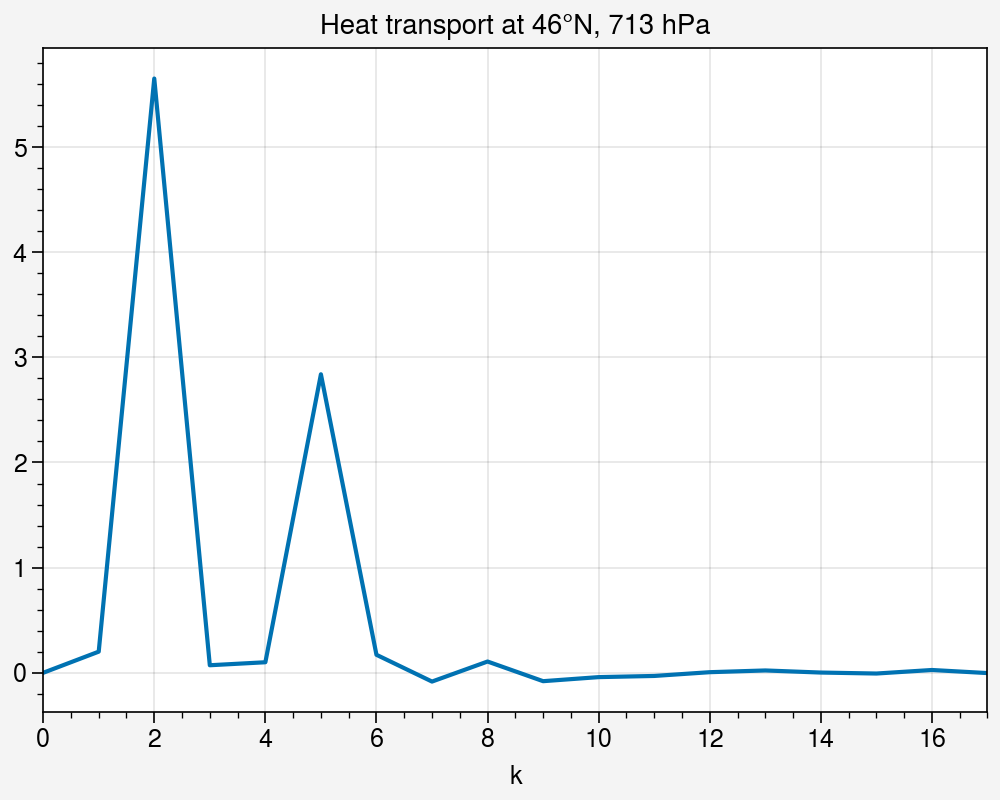

In [13]:
def heat_transport_fourier(va, ta):
    vfft = xr_spatial_fft_analysis(va)
    tfft = xr_spatial_fft_analysis(ta)
    vT_t = (np.real(tfft)*np.real(vfft) + np.imag(tfft)*np.imag(vfft))

    return vT_t

def plot_spectral_vT(vT_t, kmin=0, kmax=18):
    fig, ax = pplt.subplots(figsize=(5,4))
    ax.plot(vT_t.k[kmin:kmax],vT_t[kmin:kmax])
    ax.set_title(f'Heat transport at {int(vT_t.lat.values)}°N, {int(vT_t.plev.values)} hPa')
    
    return fig, ax

vT_t = heat_transport_fourier(ds_va.mean('time'), ds_ta.mean('time'))
fig, ax = plot_spectral_vT(vT_t)
plt.savefig(f'{exp_name}_heat_transport_tavg.{plot_format}')

## Hayashi Spectra

In [14]:
def compute_harmonics(data, m=None):

    """
    time series  time series to approximate
    m            number of harmonics
    """

    # Set parapeters and set time series to right format
    ts = np.array(data)    
    time = np.arange(1, len(ts)+1, 1)
    n = len(ts)

    if m is None:
        m = int(data.size/2) # uses the fact that int() takes the int closer to zero
    
    # Initialize Coefficient vectors
    A_k = np.zeros(m)
    B_k = np.zeros(m)
    C_k = np.zeros(m)
    data_t = np.ones(len(ts)) * np.mean(ts)
    
    A_k[0] = np.mean(ts)
    # Optional: phase angles
#    phi_k = np.zeros(n)

    if m >= 1:
        for i in np.arange(1, m, 1):
            # Precompute sine and cosine terms
            cos_term = np.cos(2*np.pi*(i)*time/n)
            sin_term = np.sin(2*np.pi*(i)*time/n)

            # Compute Coefficients for Fourier Series
            A_k[i] = 2/n * sum(ts*cos_term)
            B_k[i] = 2/n * sum(ts*sin_term)

            # Optional: Compute phase angles
    #        if A_k[i] > 0:
    #            phi_k[i] = np.arctan(A_k[i]/B_k[i])
    #        elif A_k[i] < 0:
    #            phi_k[i] = np.arctan(A_k[i]/B_k[i]) + np.pi
    #        else:
    #            (A_k[i]/B_k[i]) = np.pi/2

            # Add new term to series
            data_t += (A_k[i] * cos_term + B_k[i] * sin_term)

    # Compute amplitude for information about spectrum
    C_k = np.sqrt(A_k**2 + B_k**2)

    return A_k, B_k, C_k, data_t


def compute_hayashi_spectra(data, k, w):
    """
    data = data(t,lon)
    k = no. of zonal wavenumbers
    w = no. of wavenumbers in time
    
    Steps:
    1) compute time dependent Fourier coefficients C(k,t), S(k,t) from zonal Fourier transformations
    2) compute Fourier coefficients of C and S
    3) compute cospectra and quadrature spectrum to calculate the power spectrum
    """
    # prep
    
    n_t = data.shape[0]
    
    # zonal fourier coefficients 
    c_kt = np.zeros([n_t,k])
    s_kt = np.zeros([n_t,k])
    
    # temporal fourier coefficients for c_kt (cos term)
    a_c = np.zeros([k,w])
    b_c = np.zeros([k,w])
    # temporal fourier coefficients for s_kt (sin term)
    a_s = np.zeros([k,w])
    b_s = np.zeros([k,w])
    
    cosp_c = np.zeros([k,w])
    cosp_s = np.zeros([k,w])
    quadsp = np.ones([k,w])
    
    #fig, ax = pplt.subplots(nrows=5, share=False)

    #print('c_kt, s_kt calculation')
    for i in range(data.shape[0]):
        # 1)
        c_kt[i], s_kt[i] = compute_harmonics(data[i], m=k)[:2]
        #print(c_kt[i])
        #print(s_kt[i])
    
    #ax[0].set_title('time mean')
    #ax[0].plot(c_kt.mean(axis=0))
    #ax[0].plot(s_kt.mean(axis=0), label='s_kt')
    #ax[0].legend()
    #
    #ax[1].set_title('space mean')
    #ax[1].plot(c_kt.mean(axis=1))
    #ax[1].plot(s_kt.mean(axis=1), label='s_kt')
    #ax[1].legend()
    #
    #ax[2].set_title('ck time space')
    #ax[2].contourf(c_kt, colorbar='r')
    #ax[3].contourf(s_kt, colorbar='r')
    #
    #ax[4].set_title('ak + bk')
    #ax[4].contourf((c_kt + s_kt))
    #fig2, ax2 = pplt.subplots(nrows=4, share=False)
    
    for j in range(k):
        # 2) 
        a_c[j], b_c[j] = compute_harmonics(c_kt[:,j], m=w)[:2]
        
        a_s[j], b_s[j] = compute_harmonics(s_kt[:,j], m=w)[:2]
        
        # 3)
        cosp_c[j] = 0.5 * (a_c[j] **2 + b_c[j]**2)
        cosp_s[j] = 0.5 * (a_s[j] **2 + b_s[j]**2)
        quadsp[j] = 0.5 * (b_c[j]*a_s[j] - a_c[j]*b_s[j])

    
    #ax2[0].set_title('a_c')
    #ax2[0].contourf(a_c)
    #ax2[1].set_title('b_c')
    #ax2[1].contourf(b_c)
    #
    #ax2[2].set_title('a_s')
    #ax2[2].contourf(a_s)
    #ax2[3].set_title('b_s')
    #ax2[3].contourf(b_s) 
        
    hayashi_spectra = np.zeros([k, w*2+1])
    #fig, ax = pplt.subplots(ncols=3, share=False)
    #ax[0].pcolormesh(quadsp.T, colorbar='r')
    #ax[1].pcolormesh(cosp_c.T, colorbar='r')
    #ax[2].pcolormesh(cosp_s.T, colorbar='r')

    hayashi_spectra[:,:w] = np.flip((cosp_c + cosp_s - 2 * quadsp) * 0.25, axis=1)
    hayashi_spectra[:,w+1:] = (cosp_c + cosp_s + 2 * quadsp) * 0.25
    hayashi_spectra[:,w] = np.nan
    return hayashi_spectra



In [15]:
ds_pls.plev

<xarray.DataArray 'plev' (plev: 5)>
array([204.36862, 300.0027 , 485.8142 , 713.7252 , 857.1505 ], dtype=float32)
Coordinates:
  * plev     (plev) float32 204.4 300.0 485.8 713.7 857.2
Attributes:
    units:          hPa
    positive:       down
    interpolation:  linear

In [16]:
ds_va = ds_pls.vm1.sel(plev=ds_pls.plev[0], lat=slice(50,20)).weighted(weights=hor_weights).mean(['lat']) - ds_pls.vm1.sel(plev=ds_pls.plev[0], lat=slice(60,30)).weighted(weights=hor_weights).mean(['lat']).mean('lon')
ds_v = ds_pls.vm1.sel(plev=ds_pls.plev[0], lat=slice(50,20)).weighted(weights=hor_weights).mean(['lat'])
k = 30
w = 140

ds_va_samples = ds_va.resample(time='180D', closed='left', label='left')
#ds_va_samples = ds_va_samples.where(ds_va_samples.count() >= 180)
n_samples = ds_va_samples.count().time.size
hayashi_spectra = np.zeros([n_samples, k, w*2+1])
i = 0
for t,ds in ds_va_samples:
    if ds.time.size != 180:
        continue
    hayashi_spectra[i] = compute_hayashi_spectra(ds.values, k, w)
    i += 1

In [17]:
ks = np.arange(k)
ws = np.arange(-w, w+1, 1)
freqs = (ws * 2*np.pi) / 180 # 1/d

da_hs = xr.DataArray(hayashi_spectra,
                     dims=['time', 'k', 'f'],
                     coords=dict(k = (['k'], ks),
                                 f = (['f'], freqs),
                                 time = (['time'], ds_va_samples.count().time.data))
                    )
da_hs.mean('time').rolling({'k':3}).mean()
     

<xarray.DataArray (k: 30, f: 281)>
array([[           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [1.11842315e-04, 4.58360238e-05, 6.82237622e-05, ...,
        7.62561331e-05, 2.21280391e-04, 5.45526871e-05],
       ...,
       [1.67989473e-04, 1.13498517e-04, 5.62314883e-05, ...,
        1.15100157e-04, 1.39893320e-04, 4.41801558e-05],
       [1.12636900e-04, 4.73920324e-05, 8.11004149e-05, ...,
        7.52401673e-05, 8.00261218e-05, 5.61925768e-05],
       [8.59588611e-05, 5.96641518e-05, 8.80306191e-05, ...,
        5.13491065e-05, 4.88755968e-05, 5.09415478e-05]])
Coordinates:
  * k        (k) int64 0 1 2 3 4 5 6 7 8 9 10 ... 20 21 22 23 24 25 26 27 28 29
  * f        (f) float64 -4.887 -4.852 -4.817 -4.782 ... 4.782 4.817 4.852 4.887

(Figure(nrows=1, ncols=1, figwidth=5.0, figheight=4.0),
 SubplotGrid(nrows=1, ncols=1, length=1))

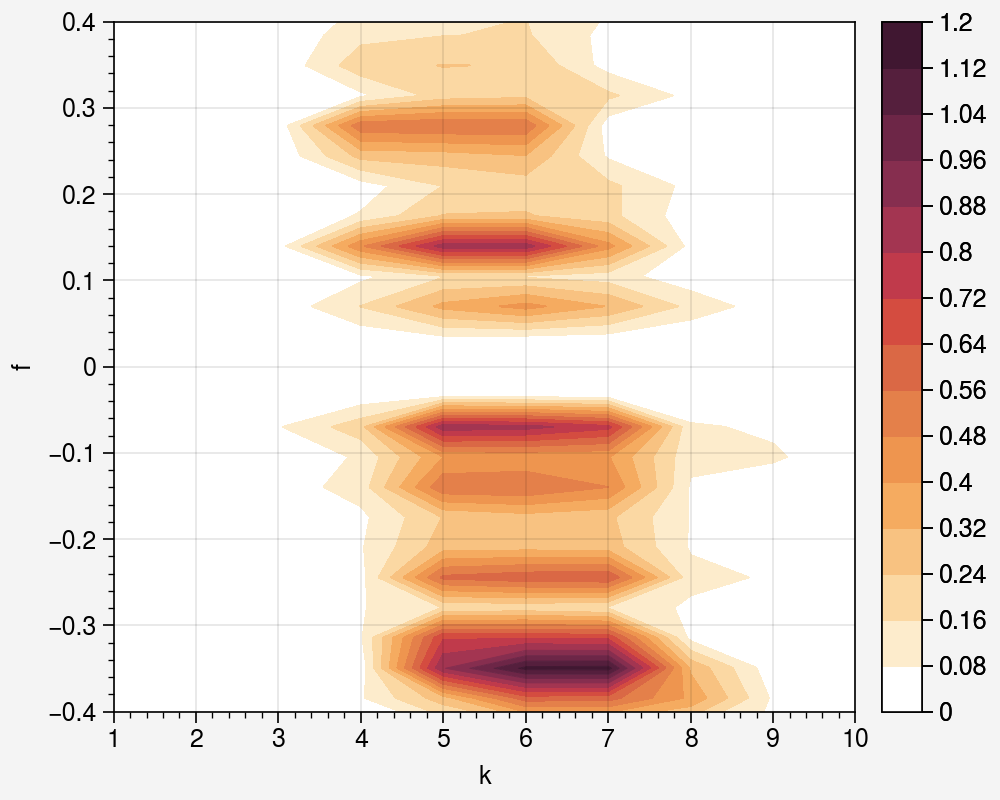

In [18]:
def plot_hayashi_spectra(data, fmin=-0.4, fmax=0.4, kmin=1, kmax=10):
    fig, ax = pplt.subplots(figsize=(5,4))
    ax.contourf(da_hs.k, da_hs.f, da_hs.mean('time').rolling(k=3, center=True).mean().T, levels=15, colorbar='right')
    ax.set_ylim([fmin,fmax])
    ax.set_xlim([kmin,kmax])
    return fig, ax

plot_hayashi_spectra(da_hs)

w = 140


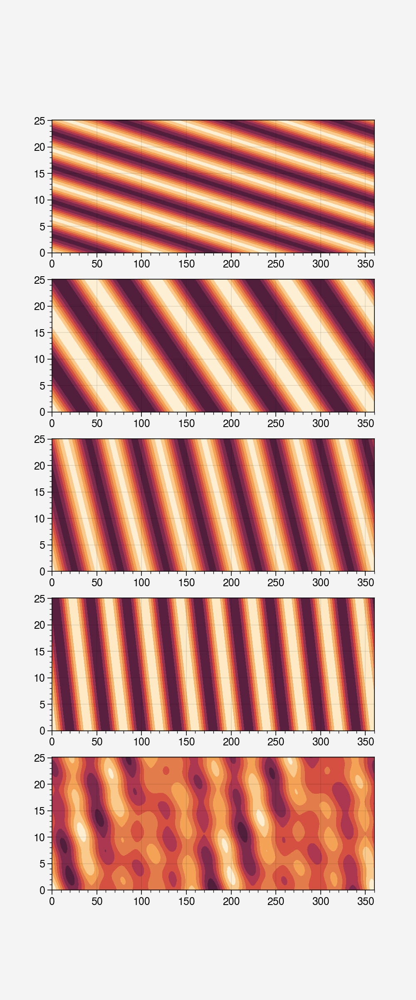

In [19]:
lon = np.arange(0, 360.1, 0.25)
time = np.arange(0, 25.1, 0.01)



print(f'w = {w}')
k_s = [3,5,7,9]
w_ww =  500/np.array(k_s)**2  * 2 * np.pi / 360
w_ew =  - 500/np.array(k_s)**2 * 2 * np.pi / 360
r_w = np.ones(len(k_s))
#r_w = np.array(k_s)**0.5 
r_nw = np.array(k_s)**0.75
#r_nw = np.zeros(len(k_s))

lons, times = np.meshgrid(lon, time)

n = len(k_s)
fig, ax = plt.subplots(nrows=n+1, figsize=(5,12))

def generate_wavefield(n):
    w_xt = np.zeros([time.size, lon.size])
    for i in range(n):
        ax[i].contourf(lon, time, r_w[i] * np.cos(k_s[i] * np.radians(lons) + w_ww[i] * times) - r_nw[i] * np.cos(k_s[i] * np.radians(lons) - w_ew[i] * times))
        w_xt += r_w[i] * np.cos(k_s[i] * np.radians(lons) + w_ww[i] * times) - r_nw[i] * np.cos(k_s[i] * np.radians(lons) - w_ew[i] * times)
    return w_xt

w_xt = generate_wavefield(n)

ax[-1].contourf(lon, time, w_xt)

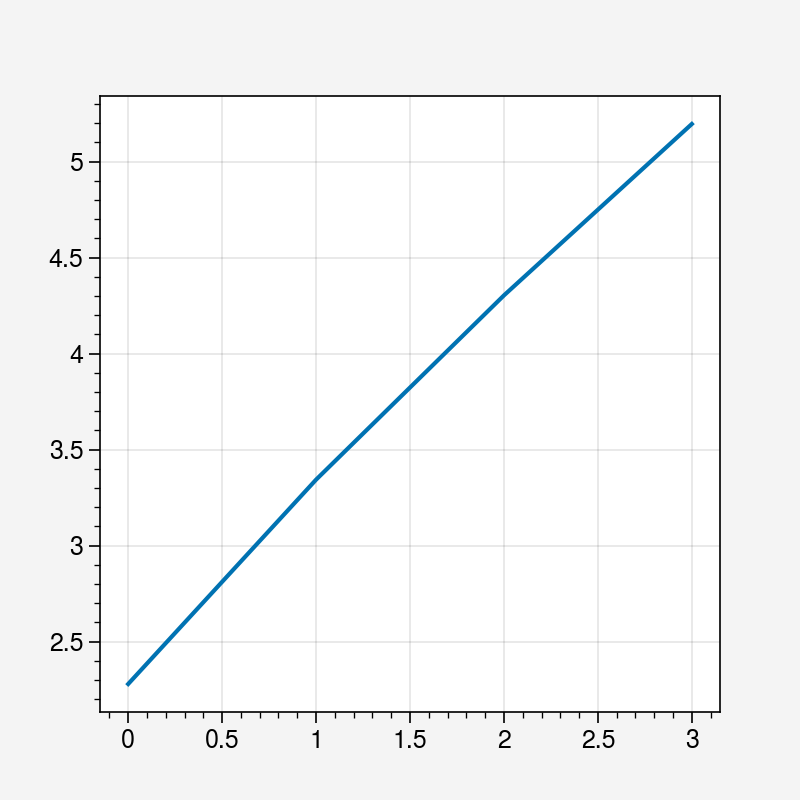

In [63]:
plt.plot(r_nw)

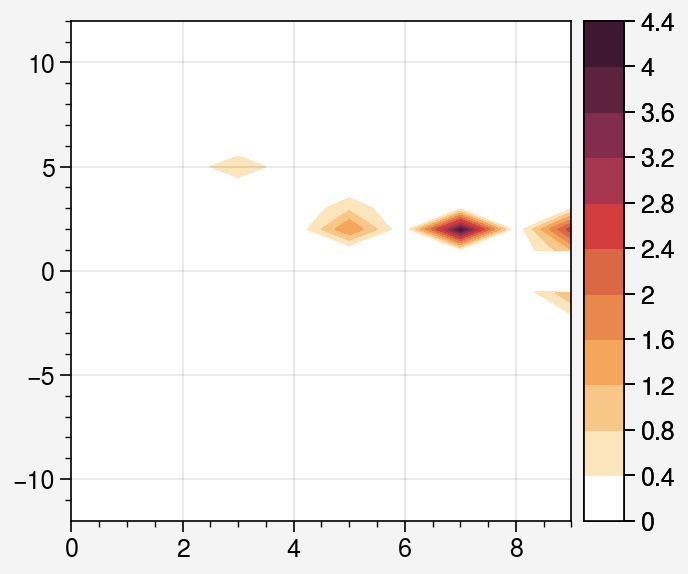

In [66]:
k = 10
w = 12
demo_hayashi_spectrum = compute_hayashi_spectra(w_xt, k=k, w=w)
ks = np.arange(0,k,1)
ws = np.arange(-w,w+1,1)

fig, ax = pplt.subplots()
ax.contourf(ks, ws, demo_hayashi_spectrum.T, colorbar='r')

## PCA Analysis

In [20]:
from numpy.lib.stride_tricks import sliding_window_view

def ps(x, signal):
    
    # compute power spectrum
    n = len(x)
    dx = x[1] - x[0]
    freq = np.fft.rfftfreq(n, d=dx)
    t = 1 / np.where(freq != 0, freq, 1e-12)  # avoid division by 0
    signal_fft = np.fft.rfft(signal, norm="forward")
    signal_power = np.square(np.abs(signal_fft))
    return t, freq, signal_power

def plot_ps(freq, signal_power):


    # plot power spectrum
    fig, ax = plt.subplots()
    ax.plot(1/freq[1:], signal_power[1:])
    ax.set_xscale("log")
    ax.xaxis.set_major_locator(mticker.LogLocator(base=10, subs=[1, 2, 5]))
    ax.xaxis.set_minor_locator(mticker.LogLocator(base=10, subs="all"))
    ax.xaxis.set_major_formatter(mticker.ScalarFormatter())
    ax.set_xlabel("period [d]")
    ax.set_title("Power Spectral Density")
    #ax.set_xlim(1, 1 / freq[1])

    return fig, ax

def f_test(x, nchunks=1):
    p_val = (
        np.min(
            [
                scipy.stats.f.cdf(x, dfn=2 * nchunks, dfd=1_000),
                1 - scipy.stats.f.cdf(x, dfn=2 * nchunks, dfd=1_000),
            ],
            axis=0,
        )
        * 2
    )
    return p_val

def rednoise_spectrum(r_a1, freqs, dx):
    return (1 - r_a1**2) / (1 - 2*r_a1 * np.cos(2*np.pi*freqs * dx) + r_a1**2) 

autocorrelation PC 1: 0.9753507496632267 
 e-folding time: 40.1 days
autocorrelation PC 2: 0.9455024802833429 
 e-folding time: 17.8 days
autocorrelation PC 3: 0.935355842378568 
 e-folding time: 15.0 days


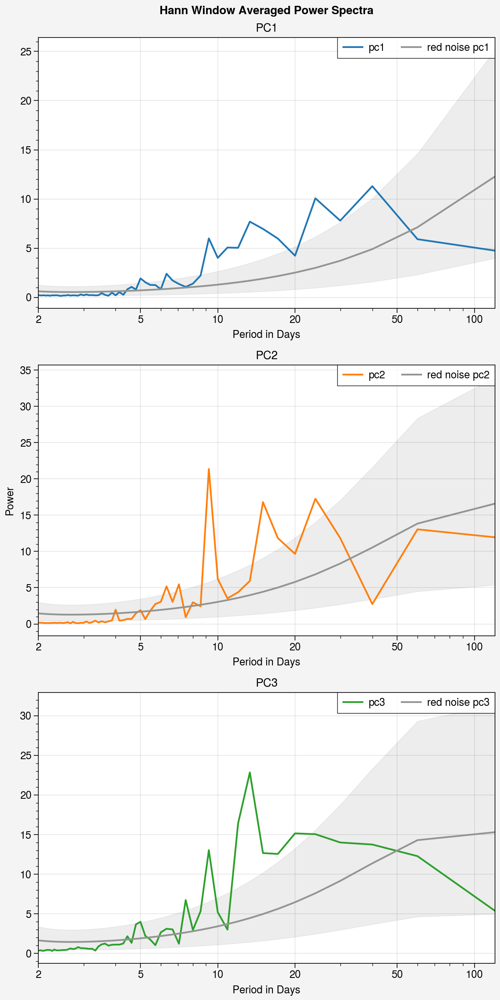

In [23]:
window_size=120
half_window=int(window_size/2)

n_pcs = 3
fig, axes = pplt.subplots(nrows=n_pcs, figsize=(6,int(4*n_pcs)), sharex=False)
fig.suptitle('Hann Window Averaged Power Spectra')

x = np.arange(0, window_size, 1)
dx = x[1] - x[0]
wl = x.size
freqs = np.fft.rfftfreq(wl, dx)
periods = 1/freqs[1:]
hann_window = np.hanning(window_size)
pc = ds_pcs.pcs.sel(mode=0)
pc_windows = sliding_window_view(pc, window_size)[::half_window]
nwindows = pc_windows.shape[0]
    
colors=['tab:blue', 'tab:orange', 'tab:green', 'tab:purple', 'tab_brown', 'tab:pink']
f_stat_low = scipy.stats.f.ppf(q = 0.975, dfn=2*nwindows, dfd=1e4)
f_stat_high = scipy.stats.f.ppf(q = 0.025, dfn=2*nwindows, dfd=1e4)


for i in range(n_pcs):
    pc = ds_pcs.pcs.sel(mode=i)
    pc_windows = sliding_window_view(pc, window_size)[::half_window]
    pow_n = np.zeros([nwindows, half_window])

    for j in range(nwindows):
        fc = np.fft.rfft(pc_windows[j], norm='forward')[1:]

        pow_n[j] = np.square(np.abs(fc))

    pow_avg = np.mean(pow_n, axis=0)

    axes[i].plot(periods, pow_avg * freqs[1:] * 1e4, label=f'pc{i+1}', color=colors[i])
    axes[i].set_title(f'PC{i+1}')

    r_a1pc = np.corrcoef(pc.values[1:], pc.values[:-1])[1,0]
    print(f'autocorrelation PC {i+1}: {r_a1pc} \n e-folding time: {- dx/np.log(r_a1pc):.3} days')

    rn_pc = rednoise_spectrum(r_a1pc, freqs[1:], dx)
    rn_pc = (rn_pc/rn_pc.sum()) * pow_avg.sum()

    pval_pc = f_test(pow_avg / rn_pc, nchunks=nwindows)
    #axes[i].plot(periods, pval_pc, c="k", lw=1, label="p Value")

    axes[i].plot(periods, rn_pc * freqs[1:] * 1e4, color='gray', label=f'red noise pc{i+1}')

    axes[i].fill_between(periods, (rn_pc * freqs[1:] * 1e4)*f_stat_low, (rn_pc * freqs[1:] * 1e4)*f_stat_high, color='darkgray', alpha=.2)

for ax in axes:
    ax.set_ylabel('Power')
    ax.set_xlabel('Period in Days')

    ax.set_xscale("log")
    ax.set_xlim([2, window_size])
    ax.xaxis.set_major_locator(mticker.LogLocator(base=10, subs=[1, 2, 5]))
    ax.xaxis.set_minor_locator(mticker.LogLocator(base=10, subs="all"))
    ax.xaxis.set_major_formatter(mticker.ScalarFormatter())
    ax.legend()

plt.show()
fig.savefig(f'{exp_name}_pc_power_spectra.{plot_format}')

In [ ]:
pls = ds_pls.plev.values
ds_pls.sel(plev=pls[3], time='2000-01-01').geopot_p.plot(figsize=(12,3))

<a list of 1 Line2D objects>

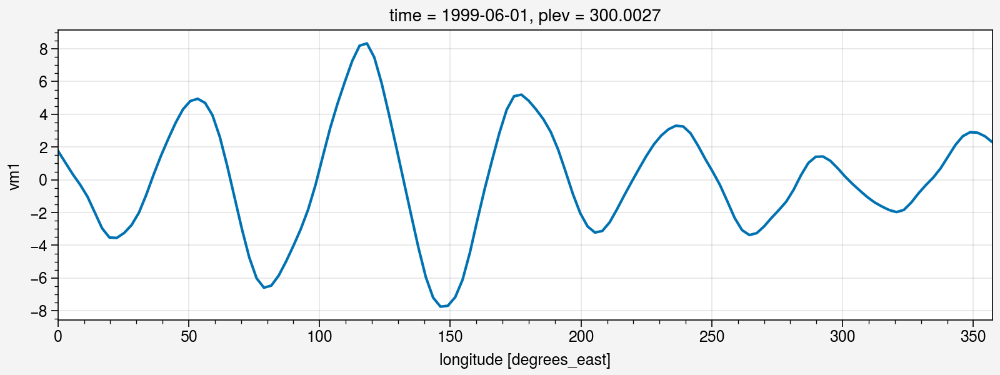

In [25]:
ds_va = ds_pls.vm1.sel(plev=ds_pls.plev[1], lat=slice(60,30)).mean(['lat']) - ds_pls.vm1.sel(plev=ds_pls.plev[1], lat=slice(60,30)).mean(['lat']).mean('lon')
ds = ds_va.resample(time='QS-DEC').mean('time')
fig, ax = pplt.subplots(figsize=(8,3))
i = 2
ds.isel(time=i).plot(ax = ax)
#ax.plot(ds_va.lon.values, compute_harmonics(ds.isel(time=i).values, m=6)[3])
#plt.savefig(f'example_extratropical_v_prime_band.{plot_format}')

In [57]:
resample_freqs_numeral[i]

112.0

In [28]:
resample_freqs = ['1D','3D', '1W', '2W', '4W', '8W', '16W', '32W'] # , '1Y', '2Y', '3Y'
resample_freqs_numeral = np.array([1/7, 3/7, 1, 2, 4, 8, 16, 32]) * 7 #  52, 104, 156

kmax = 15

def calculate_wave_persistency_coeffs(data, resample_freqs_numeral, m):
    """
    m = no of wavenumbers to include in Fourier series
    """
    # compute coefficients for all timesteps
    a_k = np.zeros([len(resample_freqs), m])
    b_k = np.zeros([len(resample_freqs), m])
    c_k = np.zeros([len(resample_freqs), m])

    for i in range(len(resample_freqs)):
        """ resample:
        if i < len(resample_freqs):
            ds = data.resample(time=resample_freqs[i], skipna=True).mean('time')
        elif i == len(resample_freqs):
            ds = data.mean('time')
        """
        # rolling mean:
        if i == 0:
            ds = data
        else:
            ds = data.rolling(time=int(resample_freqs_numeral[i])).mean('time').dropna('time')
        a_kh = np.zeros([ds.time.size, m])
        b_kh = np.zeros([ds.time.size, m])
        c_kh = np.zeros([ds.time.size, m])
        for t in range(ds.time.size):
            ds_sel = ds.isel(time=t)
            a_kh[t], b_kh[t], c_kh[t] = compute_harmonics(ds_sel.values, m=m)[:3]

        a_k[i] = np.mean(a_kh, axis=0)
        b_k[i] = np.mean(b_kh, axis=0)
        c_k[i] = np.mean(c_kh, axis=0)
    
    return a_k, b_k, c_k

a_k, b_k, c_k = calculate_wave_persistency_coeffs(ds_va, resample_freqs_numeral, kmax)

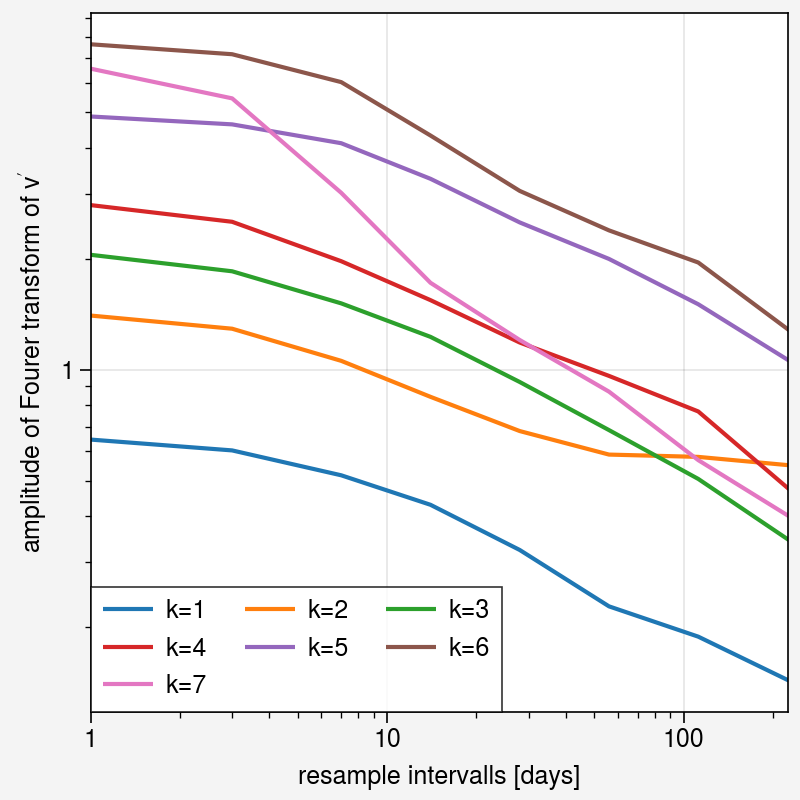

In [29]:

def plot_wave_persistency(ds, resample_freqs_numeral, kmin=1, kmax=7):
    fig, ax = pplt.subplots(figsize=(4,4))
    for i in range(kmin,kmax+1):
        ax.plot(resample_freqs_numeral, c_k.T[i], label=f'k={i}', cycle='tab10')
    ax.legend()
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel('resample intervalls [days]')
    ax.set_ylabel("amplitude of Fourer transform of $v'$" )
    return fig, ax

fig, ax = plot_wave_persistency(ds, resample_freqs_numeral)
#fig.savefig(f'{exp_name}_wave_persistence_abs.{plot_format}')


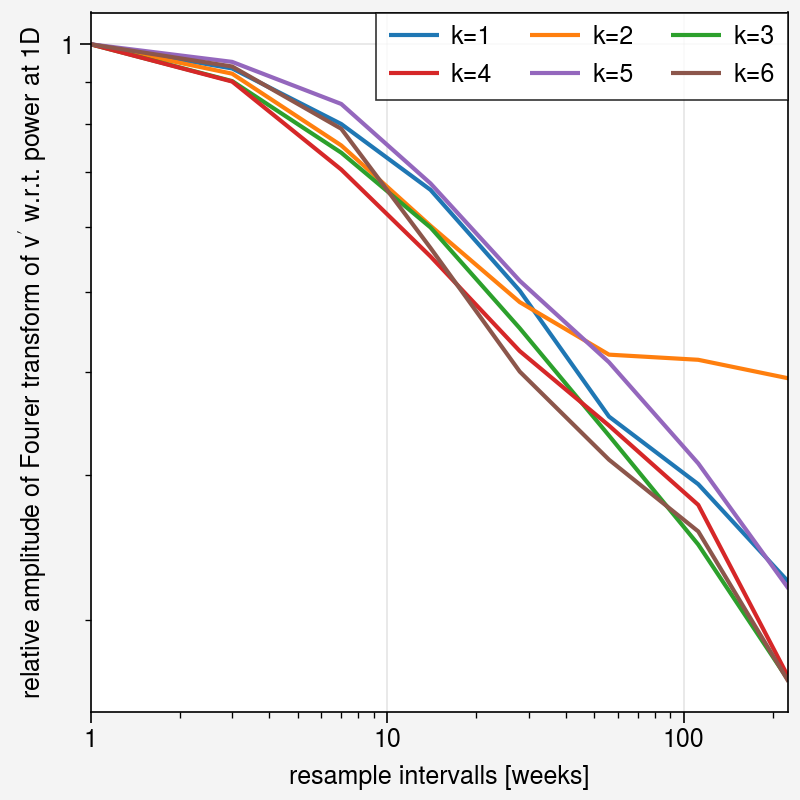

In [30]:
fig, ax = pplt.subplots(figsize=(4,4))
for i in range(1,7):
    ax.plot(resample_freqs_numeral, c_k.T[i]/c_k.T[i,0], label=f'k={i}', cycle='tab10')
    
ax.legend()
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlabel('resample intervalls [weeks]')
ax.set_ylabel("relative amplitude of Fourer transform of $v'$ w.r.t. power at 1D" )
fig.savefig(f'{exp_name}_wave_persistence_rel.{plot_format}')

## Eddy Event Analysis

numpy.datetime64('1999-03-24T00:00:00.000000000')

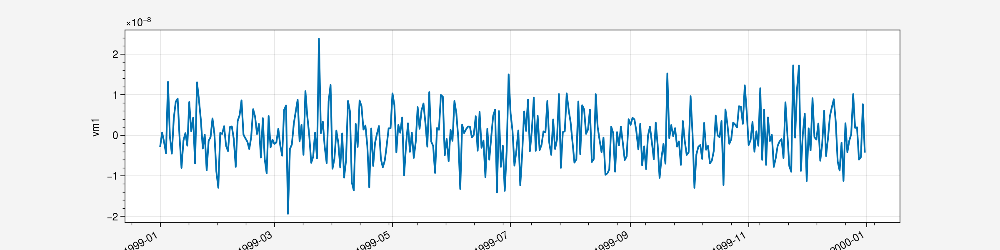

In [31]:
variable = 'vm1'
ds = ds_pls
ds_ea = ds[variable] - ds[variable].mean(['lon'])
time_series = ds_ea.mean(['lat', 'plev', 'lon'])

time_series.plot(figsize=[12, 3])
plt.savefig(f'{exp_name}_{variable}_anom_timeseries.{plot_format}')
event_date = time_series.time.where(time_series == time_series.max(), drop=True).values[0]
event_date

(Figure(nrows=2, ncols=4, refwidth=2.5),
 SubplotGrid(nrows=2, ncols=4, length=8))

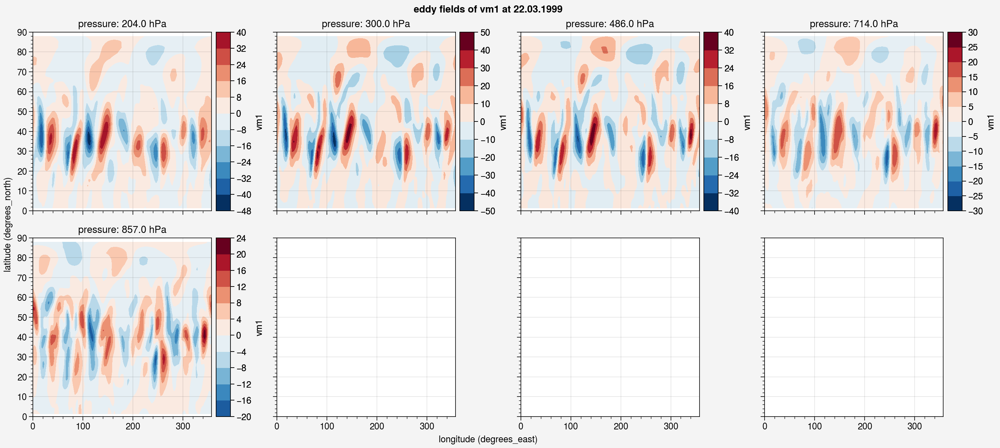

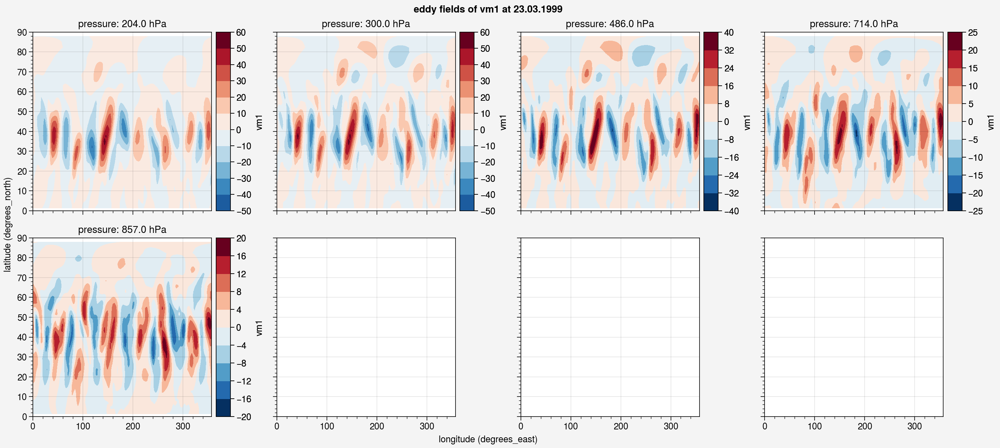

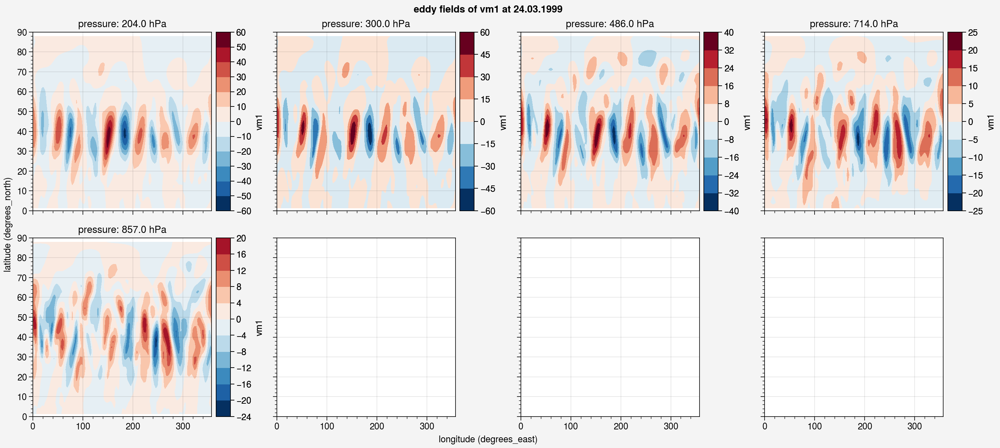

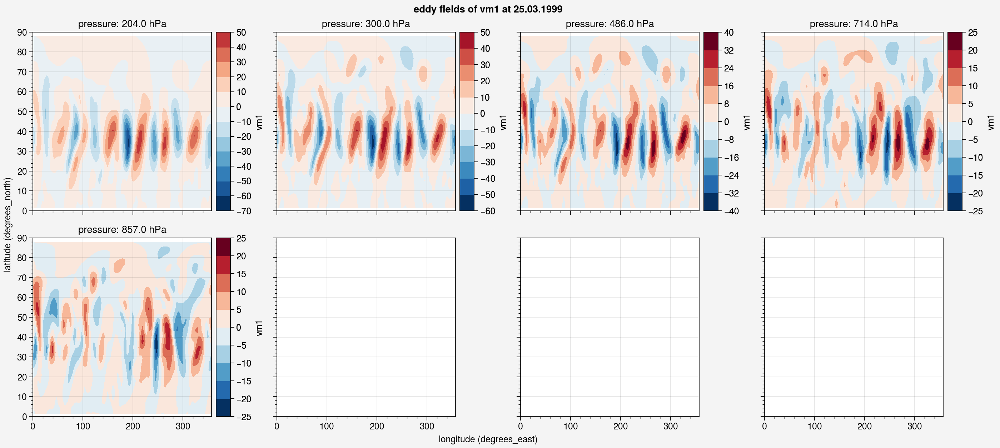

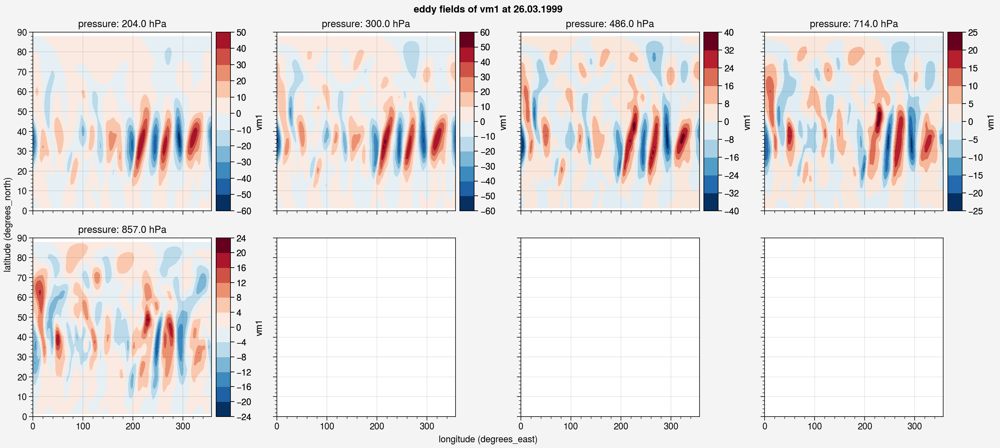

In [32]:
def plot_eddy_fields(ds, variable, timestep, savefig=False):
    
    nlevs = ds.plev.size
    if nlevs <=4:
        fig, ax = pplt.subplots(ncols=nlevs)
    else:
        fig, ax = pplt.subplots(ncols=4, nrows=int(np.ceil(nlevs/4)))
    
    fig.suptitle(f'eddy fields of {variable} at {pd.to_datetime(timestep).strftime("%d.%m.%Y")}')
    
    for i in range(nlevs):
        ax[i].contourf(ds.lon, ds.lat, (ds[variable].isel(plev=i) - ds[variable].isel(plev=i).mean(['lon'])).sel(time=timestep), colorbar='r')
        ax[i].set_ylim([0,90])
        ax[i].set_title(f'pressure: {np.round(ds.plev.values[i], 0)} hPa')
        
    return fig, ax

plot_eddy_fields(ds_pls, 'vm1', event_date - np.timedelta64(2, 'D'))
plot_eddy_fields(ds_pls, 'vm1', event_date - np.timedelta64(1, 'D'))
fig, ax = plot_eddy_fields(ds_pls, 'vm1', event_date)
#fig.savefig(f'{exp_name}_{variable}_{pd.to_datetime(event_date).strftime("%d.%m.%Y")}.{plot_format}')
plot_eddy_fields(ds_pls, 'vm1', event_date + np.timedelta64(1, 'D'))
plot_eddy_fields(ds_pls, 'vm1', event_date + np.timedelta64(2, 'D'))



In [33]:
# Hovmöller 

ds_sel = ds_pls.sel(lat=45, plev=500, method='nearest')
ds_sel.sel(time=slice(event_date - np.timedelta64(20, 'D'), event_date + np.timedelta64(20, 'D'))).tm1.hvplot(cmap='viridis')

/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)
/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)


:Image   [lon,time]   (tm1)

In [35]:
proj = ccrs.Orthographic(central_latitude=90)
ds_sel = ds_pls.sel(time=slice(event_date - np.timedelta64(4, 'D'), event_date + np.timedelta64(4, 'D')))
ds_sel.tm1.sel(plev=800, method='nearest').hvplot.contourf(
    'lon', 'lat', groupby='time',levels=5,
    crs=ccrs.PlateCarree(),
    projection=proj, global_extent=True, geo=True,
    frame_width=500,
    widget_type="scrubber", widget_location="bottom",
    cmap='viridis', clim=(230, 310))

/home/b/b381739/.local/lib/python3.9/site-packages/xarray/core/indexing.py:199: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(label_value, method=method, tolerance=tolerance)
/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/

/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages/geoviews/operation/projection.py:79: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  polys = [g for g in geom if g.area > 1e-15]
/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages/cartopy/crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages/cartopy/crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=8, width=550)
        [2] HSpacer()

In [36]:
ds_pls

<xarray.Dataset>
Dimensions:   (lat: 32, lon: 128, plev: 4, time: 1097)
Coordinates:
  * time      (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2003-01-01
  * lon       (lon) float32 0.0 2.812 5.625 8.438 ... 348.8 351.6 354.4 357.2
  * plev      (plev) float32 96.92 204.4 485.8 784.4
  * lat       (lat) float32 87.86 85.1 82.31 79.53 ... 9.767 6.977 4.186 1.395
Data variables:
    um1       (time, plev, lat, lon) float32 ...
    vm1       (time, plev, lat, lon) float32 -4.325 -4.219 ... -2.171 -1.168
    vervel    (time, plev, lat, lon) float32 ...
    tm1       (time, plev, lat, lon) float32 ...
    aps       (time, lat, lon) float32 ...
    geopot_p  (time, plev, lat, lon) float32 ...
Attributes: (12/35)
    MESSy:                    MESSy version d2.55.0, http://www.messy-interfa...
    MESSy_switch:             version 1.0
    MESSy_channel:            version 2.4.3
    MESSy_tracer:             version 2.6
    MESSy_timer:              version 0.1
    MESSy_qtimer:             version 3.0
    ...                       ...
    operating_user:           Pablo Conrat Fuentes (b381739)
    channel_io_pe:            0
    channel_name:             vaxtra
    channel_file_type:        output
    channel_file_name:        EMIL_sf6_w2_a4_20000101_0000_vaxtra.nc
    channel_netcdf_lib:       4.4.0 of Nov 30 2017 12:03:40 $

In [104]:
n_days=15
for i in range(n_days):
    va = ds_va.isel(time=i)
    ta = ds_ta.isel(time=i)

    va_fft = np.fft.rfft(va)

    va_fft_en += 0.5 * np.square(np.real(va_fft))
    va_fft_avg += va_fft
    ax[0].loglog(k, 0.5 * np.square(np.real(va_fft)), color='gray')
    ax[1].plot(k, np.real(va_fft), color='gray')

va_fft_en = va_fft_en/n_days
va_fft_avg = va_fft_avg/n_days

ax[0].loglog(k, va_fft_en, color='black')
ax[0].plot(k[10:30],  40e4*k[10:30]**(-3), label='$k^{-3}$')
ax[0].plot(k[10:30],  40e3*k[10:30]**(-5/3), label='$k^{-5/3}$')
ax[1].plot(k, va_fft_avg, color='black')

ax[0].legend()

for a in ax:
    a.set_xlim([1, 45])
#plt.plot(k,  k**(-3))

NameError: name 'va_fft_en' is not defined